In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import sys
#sys.path.append("/ahg/regevdata/projects/Cell2CellCommunication/code/MIMOSCA")
import perturbseq as perturb

%matplotlib inline
import matplotlib.pyplot as plt


sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=200, color_map='viridis')
sc.logging.print_versions()
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

The `sinfo` package has changed name and is now called `session_info` to become more discoverable and self-explanatory. The `sinfo` PyPI package will be kept around to avoid breaking old installs and you can downgrade to 0.3.2 if you want to use it without seeing this message. For the latest features and bug fixes, please install `session_info` instead. The usage and defaults also changed slightly, so please review the latest README at https://gitlab.com/joelostblom/session_info.
-----
anndata     0.7.6
scanpy      1.7.2
sinfo       0.3.4
-----
PIL                 8.2.0
anyio               NA
appnope             0.1.2
attr                20.3.0
babel               2.9.0
backcall            0.2.0
bottleneck          1.3.2
brotli              NA
cairo               1.20.1
certifi             2020.12.05
cffi                1.14.5
chardet             4.0.0
cloudpickle         1.6.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask  

In [2]:
DATA="/Users/ursuo/Documents/research/baf/data/2022-03-27/single_guide"
FIGS="/Users/ursuo/Documents/research/baf/data/2022-03-27/Figures/"
pref=DATA+'/Baf.single_gene'

In [3]:
adata=sc.read(pref+'.guide_qc.lm.h5ad')
adata

Only considering the two last: ['.lm', '.h5ad'].
Only considering the two last: ['.lm', '.h5ad'].


AnnData object with n_obs × n_vars = 38677 × 1246
    obs: 'batch', 'n_genes', 'percent_mito', 'n_counts', 'batch_num11', 'batch_num3', 'batch_num0', 'batch_num12', 'batch_num4', 'batch_num9', 'batch_num6', 'batch_num5', 'batch_num14', 'batch_num8', 'batch_num13', 'batch_num2', 'batch_num10', 'batch_num1', 'batch_num7', 'louvain', 'BCL7B_1', 'BCL7B_4', 'SMARCD3_4', 'DPF1_3', 'SMARCA2_3', 'PBRM1_3', 'SMARCA4_7', 'SMARCC1_5', 'SMARCC2_4', 'SS18_3', 'ACTL6B_1', 'SMARCD1_2', 'BRD9_1', 'SMARCE1_3', 'PHF10_3', 'NTC6_IG1216445', 'ARID1A_7', 'BCL7C_3', 'BRD7_4', 'DPF3_2', 'PBRM1_1', 'SMARCB1_1', 'SMARCB1_7', 'DPF1_4', 'BCL7C_1', 'ARID2_4', 'GLTSCR1L_2', 'NTC5_mNTC100A67005', 'SMARCA2_4', 'GLTSCR1L_3', 'DPF2_2', 'SMARCA4_1', 'BCL7A_4', 'DPF1_2', 'BRD9_3', 'PHF10_4', 'SMARCE1_2', 'ACTL6B_3', 'SMARCD3_2', 'SMARCD2_2', 'BCL7B_3', 'SMARCD1_3', 'SMARCC2_3', 'ACTL6A_2', 'DPF1_1', 'SMARCD3_1', 'SMARCC1_7', 'ACTL6A_1', 'BRD7_3', 'SMARCC2_1', 'ARID1A_2', 'SMARCD2_1', 'SS18_4', 'DPF2_4', 'SS18_2', 'GLTSC

In [214]:
adata.var['new_program']

HES4             P11
ISG15             P9
RP3-395M20.12     P9
TNFRSF14          P9
MIR34AHG          P6
                ... 
MT-ND2            P1
MT-ATP8           P1
MT-ND4L           P2
MT-ND6            P0
MT-CYB            P8
Name: new_program, Length: 1246, dtype: category
Categories (13, object): ['P0', 'P1', 'P2', 'P3', ..., 'P9', 'P10', 'P11', 'P12']

In [215]:
adata.var['coef.gene2.program']

HES4             11
ISG15             8
RP3-395M20.12     8
TNFRSF14          8
MIR34AHG          5
                 ..
MT-ND2            1
MT-ATP8           1
MT-ND4L          10
MT-ND6            0
MT-CYB            9
Name: coef.gene2.program, Length: 1246, dtype: int64

In [4]:
gene2pro=adata.var['new_program']
dd={}
for pro in list(set(gene2pro)):
    dd[pro]=list(gene2pro.loc[gene2pro==pro].index)

In [5]:
def programs2go(program2gene_dict,organism="hsapiens",fdr=0.1):
    
    """Get GO terms for programs.                                                                                            
                                                                                                                                                                 
    """

    gotable=pd.DataFrame(columns=['native','p_value','program'])
    
    for program in program2gene_dict:
        print(program)
        genes=program2gene_dict[program]
        go_res=sc.queries.enrich(genes, org=organism)
        print('queried')
        go_res=go_res.loc[go_res['significant'],:]
        gotable_current=go_res.loc[go_res['source']=='GO:BP',['native','p_value']]
        if gotable_current.shape[0]==0:
            continue
        #correct p-value for multiple testing
        from statsmodels.stats.multitest import multipletests
        gotable_current['p_value']=multipletests(gotable_current['p_value'],method='fdr_bh')[1]
        gotable_current['program']='Pro: '+str(program)
        gotable=pd.concat([gotable,gotable_current],axis=0)
        print('here')
    go_table_result=gotable.pivot(index='native',columns='program')[['p_value']]
    go_table_result=go_table_result.fillna(1)
    go_table_result=-np.log10(go_table_result)
    
    #go through each program and print me the sig go terms
    for program in go_table_result.columns:
        keep=go_table_result.loc[go_table_result[program]>-np.log10(fdr),:]
        keep=keep.sort_values(by=program,ascending=False)[program]
    return(go_table_result)

gos=programs2go(dd)

P9
queried
here
P2
queried
here
P10
queried
here
P6
queried
here
P12
queried
here
P0
queried
here
P1
queried
here
P4
queried
here
P11
queried
here
P8
queried
here
P7
queried
here
P5
queried
here
P3
queried
here


In [6]:
def annotate_go(goid):
    #get parents
    gosubdag = GoSubDag(goid, godag, relationships=True, prt=False)
    go2parents = get_go2parents(gosubdag.go2obj, gosubdag.relationships)
    goid_ntgo = gosubdag.go2nt[goid]._asdict()
    
    #get the info on the parents
    res=pd.DataFrame({'go':goid,'parent':list(go2parents.keys()),'D':'000','name':'','parent_name':''})
    for parent in go2parents:
        ntgo = gosubdag.go2nt[parent]._asdict()
        res.loc[res['parent']==parent,'D']=ntgo['depth']
        res.loc[res['parent']==parent,'parent_name']=ntgo['GO_name']
        res.loc[res['parent']==parent,'name']=goid_ntgo['GO_name']
    return(res)

def annotate_go_list(go_list):
    res=pd.DataFrame(columns=['go','parent','D','name'])
    i=0
    
    all_gos=godag.keys()
    
    for goid in go_list:
        if goid in all_gos:
            print(i)
            i+=1
            res_here=annotate_go(goid)
            res=pd.concat([res,res_here],axis=0)
    return(res)

In [73]:
#all_gos=len(godag.keys())

In [8]:
from goatools.base import get_godag
godag = get_godag('go-basic.obo', optional_attrs='relationship')

  EXISTS: go-basic.obo
go-basic.obo: fmt(1.2) rel(2022-05-16) 47,071 GO Terms; optional_attrs(relationship)


In [12]:

from goatools.gosubdag.gosubdag import GoSubDag
from goatools.godag.go_tasks import get_go2parents

# Create a subset of the GO DAG which contains:
#   * The selected GO term and
#   * All the GO terms above it

go_anno=annotate_go_list(list(gos.index))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [13]:
go_anno

,go,parent,D,name,parent_name
0,GO:0000022,GO:0000070,7,mitotic spindle elongation,mitotic sister chromatid segregation
1,GO:0000022,GO:0140014,7,mitotic spindle elongation,mitotic nuclear division
2,GO:0000022,GO:0000280,6,mitotic spindle elongation,nuclear division
3,GO:0000022,GO:0048285,5,mitotic spindle elongation,organelle fission
4,GO:0000022,GO:0006996,4,mitotic spindle elongation,organelle organization
...,...,...,...,...,...
11,GO:2001251,GO:0010639,6,negative regulation of chromosome organization,negative regulation of organelle organization
12,GO:2001251,GO:0051129,5,negative regulation of chromosome organization,negative regulation of cellular component orga...
13,GO:2001251,GO:0048523,4,negative regulation of chromosome organization,negative regulation of cellular process
14,GO:2001251,GO:0048519,3,negative regulation of chromosome organization,negative regulation of biological process


In [14]:
list(set(go_anno['D']))

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

In [15]:
d1=go_anno.loc[go_anno['D']==1,:]
d2=go_anno.loc[go_anno['D']==2,:]
d3=go_anno.loc[go_anno['D']==3,:]
d4=go_anno.loc[go_anno['D']==4,:]

In [17]:
go_mapper=go_anno['name']
go_mapper.index=go_anno['go']
go_mapper=go_mapper.drop_duplicates()
found=list(set(go_mapper.index).intersection(set(gos.index)))
names=pd.DataFrame({'name':list(gos.index)},index=list(gos.index))
names.loc[found,'name']=list(go_mapper.loc[found])
gos.index=list(names['name'])
gos.head()

p_value                   \
program                                            Pro: P0 Pro: P1 Pro: P10   
mitotic spindle elongation                            -0.0    -0.0     -0.0   
mitotic sister chromatid segregation                  -0.0    -0.0     -0.0   
cell cycle checkpoint signaling                       -0.0    -0.0     -0.0   
regulation of cyclin-dependent protein serine/t...    -0.0    -0.0     -0.0   
G1/S transition of mitotic cell cycle                 -0.0    -0.0     -0.0   

                                                                              \
program                                            Pro: P11 Pro: P12 Pro: P2   
mitotic spindle elongation                             -0.0     -0.0    -0.0   
mitotic sister chromatid segregation                   -0.0     -0.0    -0.0   
cell cycle checkpoint signaling                        -0.0     -0.0    -0.0   
regulation of cyclin-dependent protein serine/t...     -0.0     -0.0    -0.0   
G1/S transition of mitotic cell cycle                  -0.0     -0.0    -0.0   

                                                                              \
program                                              Pro: P3 Pro: P4 Pro: P5   
mitotic spindle elongation                          1.429559    -0.0    -0.0   
mitotic sister chromatid segregation                7.164624    -0.0    -0.0   
cell cycle checkpoint signaling                     4.012773    -0.0    -0.0   
regulation of cyclin-dependent protein serine/t...  4.255521    -0.0    -0.0   
G1/S transition of mitotic cell cycle               1.917310    -0.0    -0.0   

                                                                            \
program                                            Pro: P6 Pro: P7 Pro: P8   
mitotic spindle elongation                            -0.0    -0.0    -0.0   
mitotic sister chromatid segregation                  -0.0    -0.0    -0.0   
cell cycle checkpoint signaling                       -0.0    -0.0    -0.0   
regulation of cyclin-dependent protein serine/t...    -0.0    -0.0    -0.0   
G1/S transition of mitotic cell cycle                 -0.0    -0.0    -0.0   

                                                            
program                                            Pro: P9  
mitotic spindle elongation                            -0.0  
mitotic sister chromatid segregation                  -0.0  
cell cycle checkpoint signaling                       -0.0  
regulation of cyclin-dependent protein serine/t...    -0.0  
G1/S transition of mitotic cell cycle                 -0.0

In [216]:
dhere=d3
go_cats=list(set(dhere['parent_name']))
go_cats.sort()
go_cats

['adaptive immune response',
 'animal organ development',
 'animal organ morphogenesis',
 'antigen processing and presentation of endogenous antigen',
 'antigen processing and presentation of exogenous antigen',
 'antigen processing and presentation of peptide antigen',
 'attachment of spindle microtubules to kinetochore',
 'biological process involved in interaction with symbiont',
 'cell activation involved in immune response',
 'cell cycle phase transition',
 'cell development',
 'cell differentiation',
 'cell migration',
 'cell-cell adhesion',
 'cellular aromatic compound metabolic process',
 'cellular biosynthetic process',
 'cellular component biogenesis',
 'cellular component organization',
 'cellular macromolecule localization',
 'cellular nitrogen compound metabolic process',
 'cellular response to biotic stimulus',
 'cellular response to chemical stimulus',
 'cellular response to endogenous stimulus',
 'cellular response to stress',
 'chemotaxis',
 'chromosome localization',


In [217]:
dhere

,go,parent,D,name,parent_name
5,GO:0000022,GO:0016043,3,mitotic spindle elongation,cellular component organization
8,GO:0000022,GO:1903047,3,mitotic spindle elongation,mitotic cell cycle process
11,GO:0000022,GO:0000278,3,mitotic spindle elongation,mitotic cell cycle
14,GO:0000022,GO:0098813,3,mitotic spindle elongation,nuclear chromosome segregation
22,GO:0000022,GO:0051231,3,mitotic spindle elongation,spindle elongation
...,...,...,...,...,...
19,GO:2001236,GO:0048583,3,regulation of extrinsic apoptotic signaling pa...,regulation of response to stimulus
20,GO:2001236,GO:0023051,3,regulation of extrinsic apoptotic signaling pa...,regulation of signaling
2,GO:2001251,GO:0016043,3,negative regulation of chromosome organization,cellular component organization
8,GO:2001251,GO:0050794,3,negative regulation of chromosome organization,regulation of cellular process


In [218]:
import seaborn as sns

color_df=pd.DataFrame({'cat_name':'','cat_color':'white','cat_name2':'',},index=gos.index)
color_df.head()
colorlist=sns.color_palette(None, len(go_cats))

i=0
for cat in go_cats:
    cat_go_terms=list(dhere.loc[dhere['parent_name']==cat,'name'])
    cat_go_terms=list(set(cat_go_terms).intersection(set(gos.index)))
    color_df.loc[cat_go_terms,'cat_name']=cat
    
    cat_first=True
    for go_term in cat_go_terms:
        color_df.loc[go_term,'cat_color']=colorlist[i]
        if cat_first:
            color_df.loc[go_term,'cat_name2']=cat+':'+go_term
            #cat_first=False
    i+=1

In [219]:
color_df.head()

,cat_name,cat_color,cat_name2
mitotic spindle elongation,spindle elongation,"(0.5490196078431373, 0.33725490196078434, 0.29...",spindle elongation:mitotic spindle elongation
mitotic sister chromatid segregation,nuclear chromosome segregation,"(0.7686274509803922, 0.611764705882353, 0.5803...",nuclear chromosome segregation:mitotic sister ...
cell cycle checkpoint signaling,regulation of cellular process,"(0.7098039215686275, 0.7411764705882353, 0.380...",regulation of cellular process:cell cycle chec...
regulation of cyclin-dependent protein serine/threonine kinase activity,regulation of metabolic process,"(0.7725490196078432, 0.6901960784313725, 0.835...",regulation of metabolic process:regulation of ...
G1/S transition of mitotic cell cycle,mitotic cell cycle process,"(0.7098039215686275, 0.7411764705882353, 0.380...",mitotic cell cycle process:G1/S transition of ...


In [220]:
color_df=color_df.sort_values(by='cat_name')


/Users/ursuo/anaconda3/lib/python3.8/site-packages/seaborn/matrix.py:1205: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  self.fig.tight_layout(**tight_params)


[[<matplotlib.axis.YTick at 0x7fd693eeaa00>],
 [Text(1, 212.5, 'regeneration:regeneration')]]

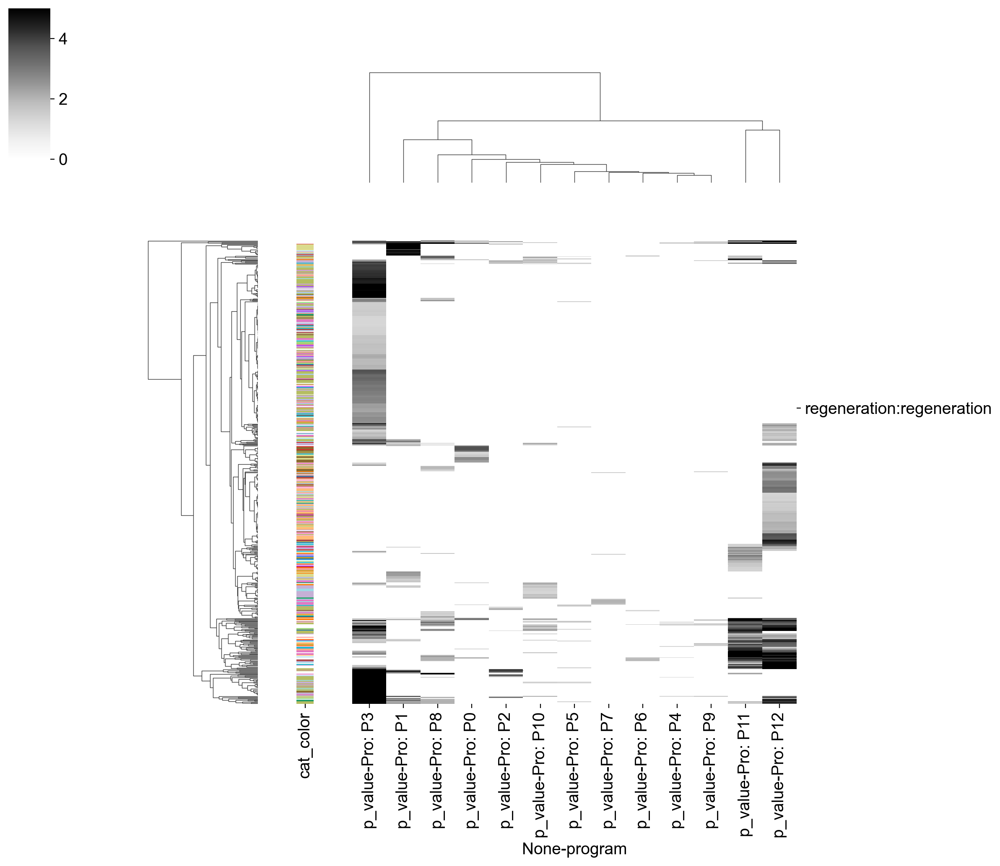

In [221]:
g=sns.clustermap(gos.loc[color_df.index,:],
               #col_cluster=False,
               #row_cluster=False,
               vmax=5,
               #figsize=(20,110),
               xticklabels=True,
               yticklabels=color_df['cat_name2'],
               cmap='Greys',
               row_colors=color_df['cat_color'])

#reordered_labels = gos.loc[color_df.index,:].index[g.dendrogram_row.reordered_ind].tolist()
reordered_labels=list(color_df['cat_name2'])
use_labels = ["regeneration:regeneration"]
use_ticks = [reordered_labels.index(label) + .5 for label in use_labels]

g.ax_heatmap.set(yticks=use_ticks, yticklabels=use_labels)

In [104]:
sns.clustermap(gos.loc[color_df.index,:],
               #col_cluster=False,
               row_cluster=False,
               vmax=5,
               figsize=(20,110),
               xticklabels=True,
               yticklabels=True,#color_df['cat_name2'],
               cmap='Greys',
               row_colors=color_df['cat_color'])

In [284]:
def get_cls_adata(adata_here,n_neighbors):
    sc.pp.neighbors(adata_here,n_neighbors=n_neighbors,use_rep='X')
    sc.tl.leiden(adata_here)
    sc.tl.umap(adata_here)
    sc.pl.umap(adata_here,color=['leiden'])
    return(adata_here.obs['leiden'])

#a method to automatically order the groups
def average_df_by_group(df,grouping):
    #groups on the rows
    
    assert df.shape[0]==len(grouping)
    
    groups=list(set(grouping))
    compact_df=pd.DataFrame(0,index=groups,columns=df.columns)
    for group in groups:
        rows_here=pd.DataFrame(df.loc[grouping==group,:])
        
        if rows_here.shape[0]==1:
            compact_df.loc[group,:]=np.array(rows_here).flatten()
        else:
            compact_df.loc[group,:]=rows_here.mean(axis=0)
    return(compact_df)

def get_cl_order(df,cl):
    #clusters are on the rows
    cluster_level_df=average_df_by_group(df,cl)
    cluster_level_df.index=list(cluster_level_df.index)
    
    #cluster in some way
    from scipy.cluster import hierarchy
    from scipy.spatial.distance import pdist
    np.random.seed(seed=7)
    cl_Z = hierarchy.linkage(cluster_level_df,
                         optimal_ordering=True,
                         method='complete')
    cl_dn = hierarchy.dendrogram(cl_Z, labels=cluster_level_df.index)

    ax = plt.gca()
    labels = ax.get_xmajorticklabels()
    ordered_cls=[]
    for i in range(len(labels)):
        ordered_cls.append(labels[i].get_text())
    plt.show()
    
    #return the order of the rows of cluster_level_df
    return(ordered_cls)

def sort_clustered_df(df,cl_rows=None,cl_cols=None,cluster_within=True):
    row_order=df.index
    col_order=df.columns
    if cl_rows is not None:
        ordered_row_cls=get_cl_order(df,cl_rows)
        row_order=[]
        for r_idx in range(len(ordered_row_cls)):
            row_cl=ordered_row_cls[r_idx]
            rows_cluster_here=[]
            for rowname_idx in range(df.shape[0]):
                rowname=df.index[rowname_idx]
                if cl_rows[rowname_idx]==row_cl:
                    rows_cluster_here.append(rowname)
            if cluster_within:
                rows_cluster_here=get_cl_order(df.loc[rows_cluster_here,:],pd.Series(rows_cluster_here,
                                                                                    index=rows_cluster_here))
            for i in range(len(rows_cluster_here)):
                row_order.append(rows_cluster_here[i])
            

    if cl_cols is not None:
        print('clustering cols')
        ordered_col_cls=get_cl_order(df.T,cl_cols)
        col_order=[]
        for c_idx in range(len(ordered_col_cls)):
            col_cl=ordered_col_cls[c_idx]
            cols_cluster_here=[]
            for colname_idx in range(df.shape[1]):
                colname=df.columns[colname_idx]
                if cl_cols[colname_idx]==col_cl:
                    cols_cluster_here.append(colname)
            if cluster_within:
                cols_cluster_here=get_cl_order(df.T.loc[cols_cluster_here,:],pd.Series(cols_cluster_here,
                                                                                    index=cols_cluster_here))
            for i in range(len(cols_cluster_here)):
                col_order.append(cols_cluster_here[i])
    return(df.loc[row_order,col_order])

def rename_by_order(ordered_df,label):
    
    old2new={}
    program_counter=0
    for i in range(ordered_df.shape[0]):
        cl=label[list(ordered_df.index)[i]]
        if cl not in old2new:
            old2new[cl]=program_counter
            program_counter+=1
    new_label=[]
    for i in range(ordered_df.shape[0]):
        cl=label[list(ordered_df.index)[i]]
        new_label.append(old2new[cl])
    new_label_df=pd.Series(new_label,index=ordered_df.index)
    return(new_label_df)

In [285]:
#get the clustering
import copy
perturbations_cl=copy.deepcopy(color_df['cat_name'])

In [286]:
color_df

,cat_name,cat_color,cat_name2
anatomical structure morphogenesis,,white,
cell division,,white,
cellular localization,,white,
localization of cell,,white,
cellular response to stimulus,,white,
...,...,...,...
protein insertion into mitochondrial outer membrane,transport,"(0.09019607843137255, 0.7450980392156863, 0.81...",transport:protein insertion into mitochondrial...
protein import,transport,"(0.09019607843137255, 0.7450980392156863, 0.81...",transport:protein import
protein import into nucleus,transport,"(0.09019607843137255, 0.7450980392156863, 0.81...",transport:protein import into nucleus
tube development,tube development,"(0.6823529411764706, 0.7803921568627451, 0.909...",tube development:tube development


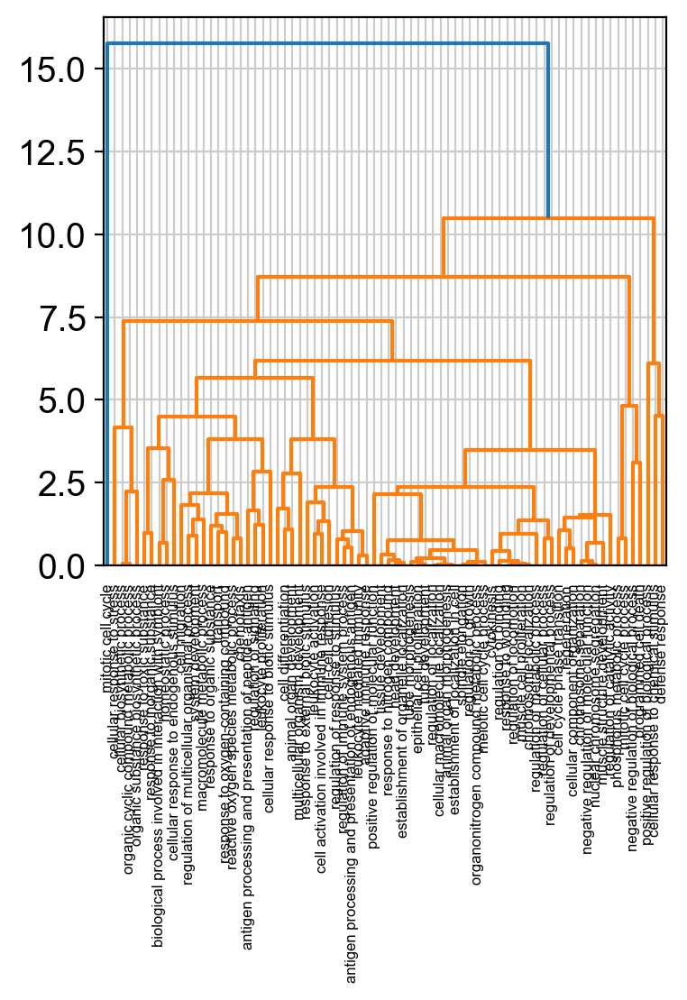

In [287]:
#sort the resulting clusters and perturbations within
ordered_df=sort_clustered_df(gos.loc[perturbations_cl.index,:],
                         perturbations_cl,
                         cl_cols=None,
                         cluster_within=False)

In [288]:
color_df.tail()

,cat_name,cat_color,cat_name2
protein insertion into mitochondrial outer membrane,transport,"(0.09019607843137255, 0.7450980392156863, 0.81...",transport:protein insertion into mitochondrial...
protein import,transport,"(0.09019607843137255, 0.7450980392156863, 0.81...",transport:protein import
protein import into nucleus,transport,"(0.09019607843137255, 0.7450980392156863, 0.81...",transport:protein import into nucleus
tube development,tube development,"(0.6823529411764706, 0.7803921568627451, 0.909...",tube development:tube development
tube morphogenesis,tube morphogenesis,"(1.0, 0.7333333333333333, 0.47058823529411764)",tube morphogenesis:tube morphogenesis


In [289]:
import copy
ordered_df2=copy.deepcopy(ordered_df)
ordered_df2.index=color_df.loc[ordered_df2.index,'cat_name2']
color_df2=copy.deepcopy(color_df)
color_df2.index=list(color_df2['cat_name2'])

In [290]:
color_df.tail()

,cat_name,cat_color,cat_name2
protein insertion into mitochondrial outer membrane,transport,"(0.09019607843137255, 0.7450980392156863, 0.81...",transport:protein insertion into mitochondrial...
protein import,transport,"(0.09019607843137255, 0.7450980392156863, 0.81...",transport:protein import
protein import into nucleus,transport,"(0.09019607843137255, 0.7450980392156863, 0.81...",transport:protein import into nucleus
tube development,tube development,"(0.6823529411764706, 0.7803921568627451, 0.909...",tube development:tube development
tube morphogenesis,tube morphogenesis,"(1.0, 0.7333333333333333, 0.47058823529411764)",tube morphogenesis:tube morphogenesis


In [291]:
ordered_df2.tail()

p_value            \
program                                              Pro: P0   Pro: P1   
cat_name2                                                                
programmed cell death:apoptotic process            -0.000000  3.163095   
positive regulation of biological process:posit... -0.000000 -0.000000   
cellular response to chemical stimulus:cellular...  2.654508 -0.000000   
defense response:inflammatory response             -0.000000 -0.000000   
defense response:defense response                  -0.000000 -0.000000   

                                                                        \
program                                             Pro: P10  Pro: P11   
cat_name2                                                                
programmed cell death:apoptotic process            -0.000000 -0.000000   
positive regulation of biological process:posit...  2.249115  4.438417   
cellular response to chemical stimulus:cellular...  2.130314  5.193664   
defense response:inflammatory response             -0.000000  3.877592   
defense response:defense response                  -0.000000  4.170785   

                                                                      \
program                                             Pro: P12 Pro: P2   
cat_name2                                                              
programmed cell death:apoptotic process             4.387003    -0.0   
positive regulation of biological process:posit...  5.335469    -0.0   
cellular response to chemical stimulus:cellular...  3.170545    -0.0   
defense response:inflammatory response              1.323056    -0.0   
defense response:defense response                   7.018518    -0.0   

                                                                              \
program                                              Pro: P3 Pro: P4 Pro: P5   
cat_name2                                                                      
programmed cell death:apoptotic process             7.936976    -0.0    -0.0   
positive regulation of biological process:posit...  4.872011    -0.0    -0.0   
cellular response to chemical stimulus:cellular...  1.801966    -0.0    -0.0   
defense response:inflammatory response             -0.000000    -0.0    -0.0   
defense response:defense response                  -0.000000    -0.0    -0.0   

                                                                              \
program                                            Pro: P6 Pro: P7   Pro: P8   
cat_name2                                                                      
programmed cell death:apoptotic process               -0.0    -0.0  2.091253   
positive regulation of biological process:posit...    -0.0    -0.0  2.620069   
cellular response to chemical stimulus:cellular...    -0.0    -0.0  1.814593   
defense response:inflammatory response                -0.0    -0.0 -0.000000   
defense response:defense response                     -0.0    -0.0 -0.000000   

                                                            
program                                            Pro: P9  
cat_name2                                                   
programmed cell death:apoptotic process               -0.0  
positive regulation of biological process:posit...    -0.0  
cellular response to chemical stimulus:cellular...    -0.0  
defense response:inflammatory response                -0.0  
defense response:defense response                     -0.0

In [229]:
color_df2['cat_color'].loc[ordered_df2.index]

mitotic cell cycle:mitotic cell cycle                                                  (0.8901960784313725, 0.4666666666666667, 0.760...
phosphorus metabolic process:phosphorylation                                           (0.5490196078431373, 0.42745098039215684, 0.19...
phosphorus metabolic process:protein phosphorylation                                   (0.5490196078431373, 0.42745098039215684, 0.19...
phosphorus metabolic process:phosphate-containing compound metabolic process           (0.5490196078431373, 0.42745098039215684, 0.19...
phosphorus metabolic process:phosphorus metabolic process                              (0.5490196078431373, 0.42745098039215684, 0.19...
                                                                                                             ...                        
cellular response to stress:cellular response to DNA damage stimulus                   (0.8392156862745098, 0.15294117647058825, 0.15...
defense response:inflammatory response   

In [292]:
keep=color_df.loc[color_df['cat_color']!='white','cat_name2']
keep

adaptive immune response                                                                                                     adaptive immune response:adaptive immune response
adaptive immune response based on somatic recombination of immune receptors built from immunoglobulin superfamily domains    adaptive immune response:adaptive immune respo...
animal organ development                                                                                                     animal organ development:animal organ development
gland development                                                                                                                   animal organ development:gland development
animal organ morphogenesis                                                                                                   animal organ morphogenesis:animal organ morpho...
                                                                                                                             

In [297]:
sns.clustermap(ordered_df2.loc[keep,:],
               row_cluster=False,col_cluster=False,
               cmap='Greys',
               figsize=(5,100),
               xticklabels=True,
               row_colors=color_df2.loc[keep,'cat_color'],
               vmax=5,
              )

In [354]:
for i in range(10):
    print(i)

0
1
2
3
4
5
6
7
8
9


In [293]:
import re
ordered_df2.columns=[re.sub('Pro: ','',c[1]) for c in list(ordered_df2.columns)]

In [349]:
desired_order1=['response to inorganic substance',
               'organic cyclic compound metabolic process',
               'mitotic cell cycle',
               'mitotic cell cycle process',
               ]

desired_order2=[
               
               
               'regulation of multicellular organismal process',
               'response to external biotic stimulus',
               
               'programmed cell death',
               'regulation of signaling',
               'response to organic substance',
    
                
               
               'cell adhesion',
               'cell migration',
    
                'regulation of metabolic process',
               
               'leukocyte activation',
               'leukocyte mediated immunity',
               'regulation of immune system process',
               'regulation of response to stimulus',
               
              ]

others=list(set(color_df['cat_name']).difference(set(desired_order1).union(set(desired_order2))))
desired_order=[]
for i in range(len(desired_order1)):
    desired_order.append(desired_order1[i])
for i in range(len(others)):
    desired_order.append(others[i])
for i in range(len(desired_order2)):
    desired_order.append(desired_order2[i])
print('order',desired_order)

sorted_groups=[]
to_show=[]
for cat_idx in range(len(desired_order)):
    cat=desired_order[cat_idx]
    print(cat)
    if cat=='':
        continue
    first=True
    for i in range(ordered_df2.shape[0]):
        if color_df['cat_name'][i]==cat:
            if first:
                to_show.append(color_df['cat_name2'][i])
                first=False
            sorted_groups.append(color_df['cat_name2'][i])
    

order ['response to inorganic substance', 'organic cyclic compound metabolic process', 'mitotic cell cycle', 'mitotic cell cycle process', '', 'positive regulation of molecular function', 'regulation of binding', 'tube development', 'response to oxygen-containing compound', 'animal organ morphogenesis', 'nuclear chromosome segregation', 'meiotic cell cycle process', 'positive regulation of biological process', 'response to nitrogen compound', 'negative regulation of biological process', 'chromosome localization', 'cell cycle phase transition', 'chromosome separation', 'negative regulation of molecular function', 'cellular biosynthetic process', 'cellular response to endogenous stimulus', 'cytokinesis', 'organic substance biosynthetic process', 'response to toxic substance', 'spindle elongation', 'antigen processing and presentation of peptide antigen', 'regulation of cellular process', 'response to wounding', 'organonitrogen compound metabolic process', 'cellular response to stress', '

In [358]:
?perturb.pl.plot_colorbar

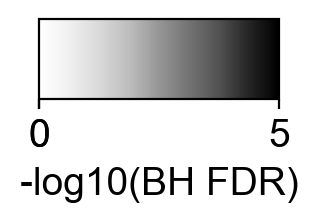

In [364]:
import matplotlib as mpl
def plot_colorbar(left=0.05,top=0.8,w=0.3,h=0.1,
                  vmin=None,vmax=None,
                  cmap=plt.cm.bwr,
                  label='Here is a label!',
                  include_zero=True,
                  outname=None,
                 ):
    fig = plt.figure()
    ax = fig.add_axes([left,top,w,h])

    ticks=[vmin,vmax]
    if include_zero:
        ticks=[vmin,0,vmax]
    cb = mpl.colorbar.ColorbarBase(ax, orientation='horizontal',
                                   cmap=cmap,
                                   norm=mpl.colors.Normalize(vmin,vmax),  # vmax and vmin
                                   label=label,
                                   ticks=ticks)

    plt.savefig(outname,transparent=True,bbox_inches='tight')

plot_colorbar(vmin=0,vmax=5,cmap=plt.cm.Greys,outname=FIGS+'single.GO.colorbar.pdf',label='-log10(BH FDR)')

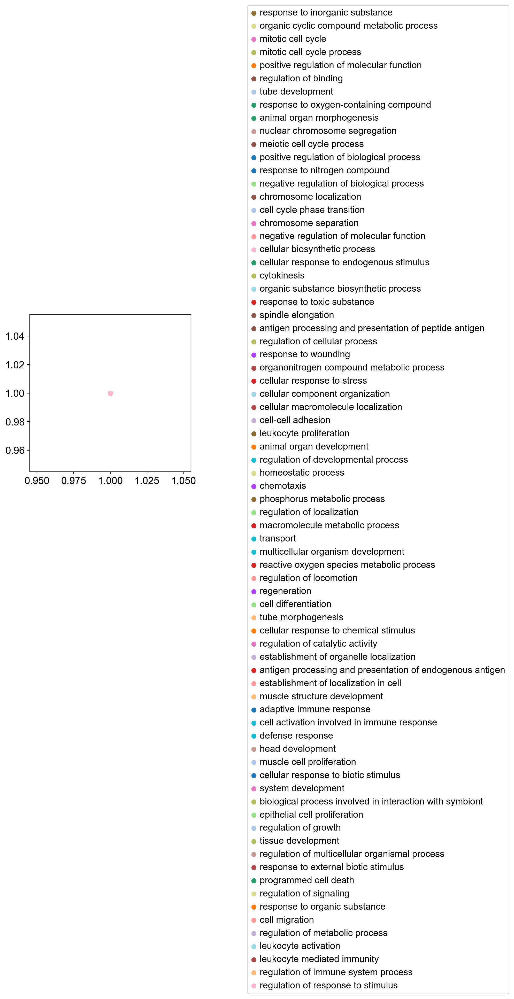

In [372]:
seen=set()
for i in sorted_groups:
    if color_df2.loc[i,'cat_name'] in seen:
        continue
    else:
        plt.scatter(1,1,label=color_df2.loc[i,'cat_name'],color=color_df2.loc[i,'cat_color'])
        seen.add(color_df2.loc[i,'cat_name'])
plt.legend(bbox_to_anchor =(3, 3))
plt.grid(False)
plt.savefig(FIGS+'single.GO.colors.pdf',transparent=True,bbox_inches='tight')

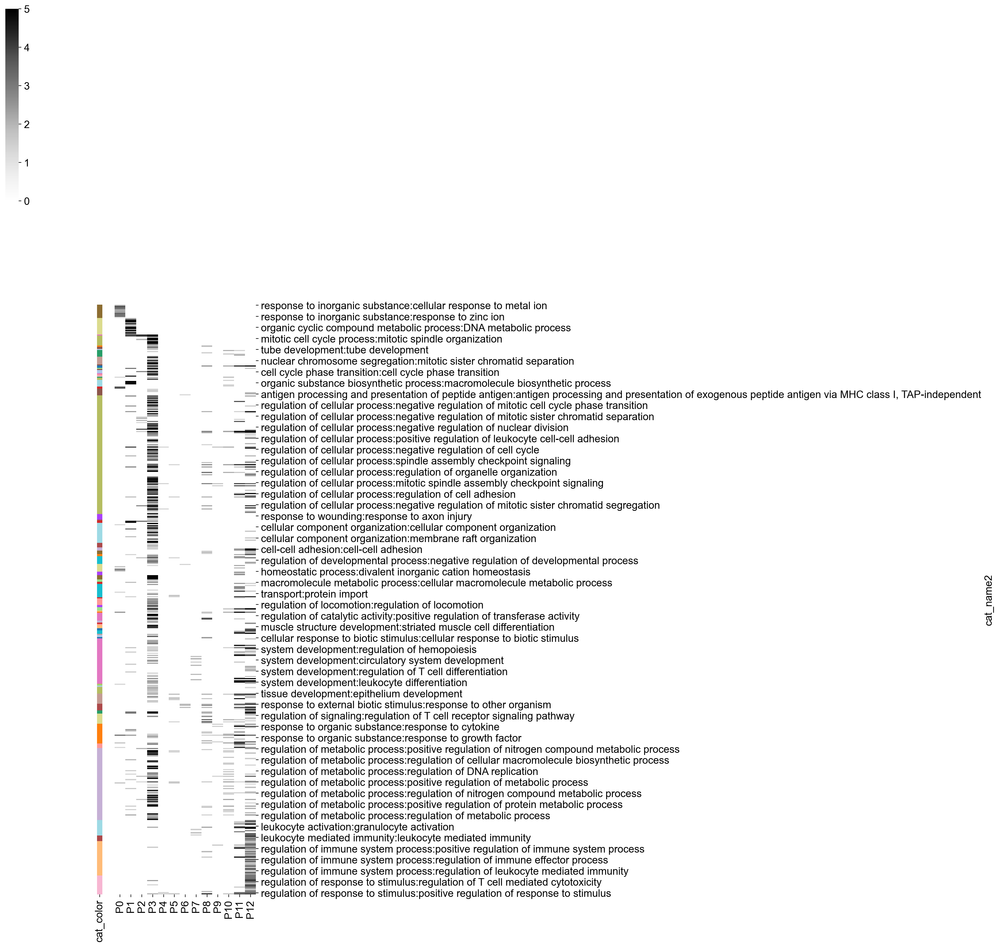

In [357]:
sns.clustermap(ordered_df2.loc[sorted_groups,['P'+str(p) for p in range(13)]],
               row_cluster=False,col_cluster=False,
               cmap='Greys',
               figsize=(5,20),
               xticklabels=True,
               row_colors=color_df2.loc[keep,'cat_color'],
               vmax=5,
              )
plt.savefig(FIGS+'single.GO.pdf',transparent=True,bbox_inches='tight')

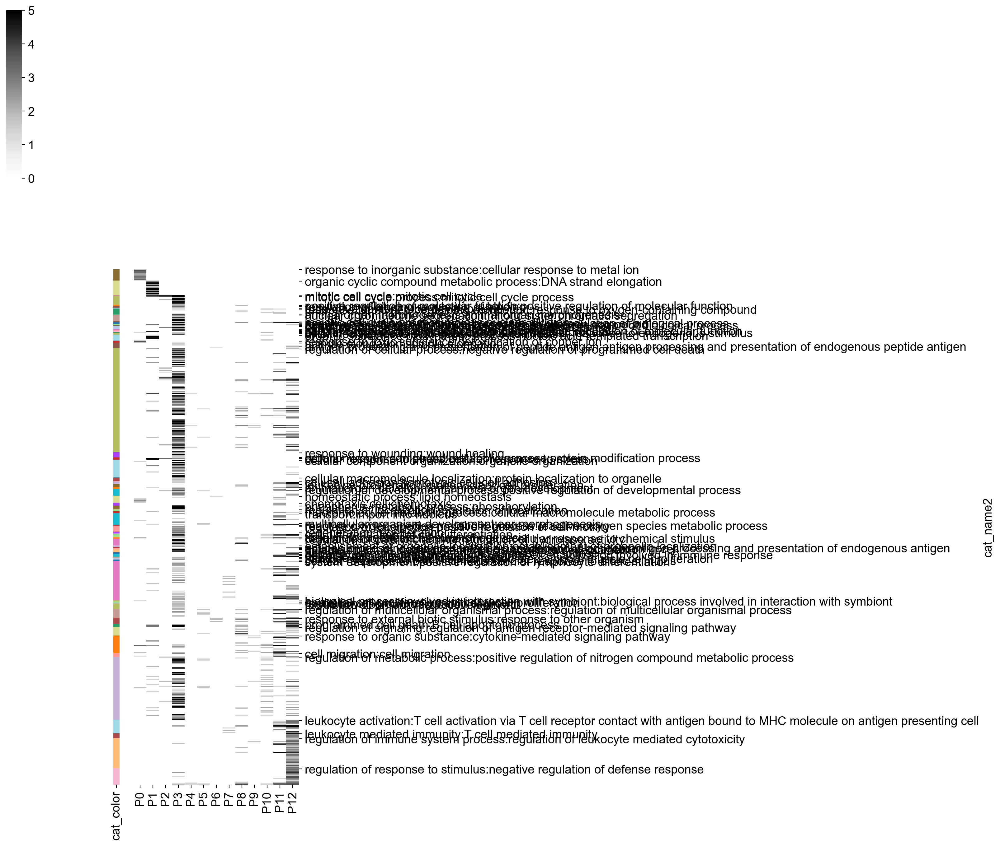

In [355]:
g=sns.clustermap(ordered_df2.loc[sorted_groups,['P'+str(p) for p in range(13)]],
               row_cluster=False,col_cluster=False,
               cmap='Greys',
               figsize=(5,15),
               xticklabels=True,
               row_colors=color_df2.loc[keep,'cat_color'],
               vmax=5,
              )

reordered_labels=sorted_groups
use_labels = to_show
use_ticks = [reordered_labels.index(label) + .5 for label in use_labels]

a=g.ax_heatmap.set(yticks=use_ticks, yticklabels=use_labels)
plt.savefig(FIGS+'single.GO.pdf',transparent=True,bbox_inches='tight')

In [347]:
FIGS

'/Users/ursuo/Documents/research/baf/data/2022-03-27/Figures/'

/Users/ursuo/anaconda3/lib/python3.8/site-packages/seaborn/matrix.py:1205: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  self.fig.tight_layout(**tight_params)


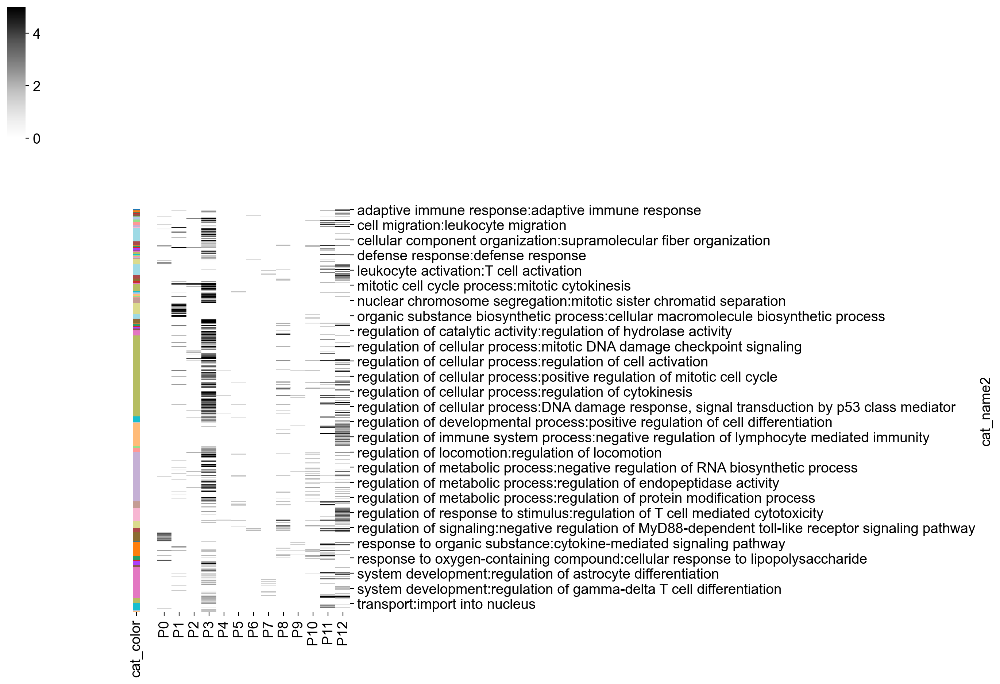

In [294]:
sns.clustermap(ordered_df2.loc[keep,['P'+str(p) for p in range(13)]],
               row_cluster=False,col_cluster=False,
               cmap='Greys',
               figsize=(5,10),
               xticklabels=True,
               row_colors=color_df2.loc[keep,'cat_color'],
               vmax=5,
              )

In [248]:
gene2pro.value_counts()

P11    159
P3     151
P12    148
P10    122
P1     109
P5     106
P8     101
P2      72
P6      70
P9      70
P4      65
P7      40
P0      33
Name: new_program, dtype: int64

In [251]:
adata

AnnData object with n_obs × n_vars = 38677 × 1246
    obs: 'batch', 'n_genes', 'percent_mito', 'n_counts', 'batch_num11', 'batch_num3', 'batch_num0', 'batch_num12', 'batch_num4', 'batch_num9', 'batch_num6', 'batch_num5', 'batch_num14', 'batch_num8', 'batch_num13', 'batch_num2', 'batch_num10', 'batch_num1', 'batch_num7', 'louvain', 'BCL7B_1', 'BCL7B_4', 'SMARCD3_4', 'DPF1_3', 'SMARCA2_3', 'PBRM1_3', 'SMARCA4_7', 'SMARCC1_5', 'SMARCC2_4', 'SS18_3', 'ACTL6B_1', 'SMARCD1_2', 'BRD9_1', 'SMARCE1_3', 'PHF10_3', 'NTC6_IG1216445', 'ARID1A_7', 'BCL7C_3', 'BRD7_4', 'DPF3_2', 'PBRM1_1', 'SMARCB1_1', 'SMARCB1_7', 'DPF1_4', 'BCL7C_1', 'ARID2_4', 'GLTSCR1L_2', 'NTC5_mNTC100A67005', 'SMARCA2_4', 'GLTSCR1L_3', 'DPF2_2', 'SMARCA4_1', 'BCL7A_4', 'DPF1_2', 'BRD9_3', 'PHF10_4', 'SMARCE1_2', 'ACTL6B_3', 'SMARCD3_2', 'SMARCD2_2', 'BCL7B_3', 'SMARCD1_3', 'SMARCC2_3', 'ACTL6A_2', 'DPF1_1', 'SMARCD3_1', 'SMARCC1_7', 'ACTL6A_1', 'BRD7_3', 'SMARCC2_1', 'ARID1A_2', 'SMARCD2_1', 'SS18_4', 'DPF2_4', 'SS18_2', 'GLTSC

In [253]:
adata.var['coef.gene2.program'].value_counts()

11    159
2     151
12    148
3     122
1     109
7     106
9     101
10     72
5      70
8      70
4      65
6      40
0      33
Name: coef.gene2.program, dtype: int64

In [254]:
gene2pro.value_counts()

P11    159
P3     151
P12    148
P10    122
P1     109
P5     106
P8     101
P2      72
P6      70
P9      70
P4      65
P7      40
P0      33
Name: new_program, dtype: int64

In [272]:
adata

AnnData object with n_obs × n_vars = 38677 × 1246
    obs: 'batch', 'n_genes', 'percent_mito', 'n_counts', 'batch_num11', 'batch_num3', 'batch_num0', 'batch_num12', 'batch_num4', 'batch_num9', 'batch_num6', 'batch_num5', 'batch_num14', 'batch_num8', 'batch_num13', 'batch_num2', 'batch_num10', 'batch_num1', 'batch_num7', 'louvain', 'BCL7B_1', 'BCL7B_4', 'SMARCD3_4', 'DPF1_3', 'SMARCA2_3', 'PBRM1_3', 'SMARCA4_7', 'SMARCC1_5', 'SMARCC2_4', 'SS18_3', 'ACTL6B_1', 'SMARCD1_2', 'BRD9_1', 'SMARCE1_3', 'PHF10_3', 'NTC6_IG1216445', 'ARID1A_7', 'BCL7C_3', 'BRD7_4', 'DPF3_2', 'PBRM1_1', 'SMARCB1_1', 'SMARCB1_7', 'DPF1_4', 'BCL7C_1', 'ARID2_4', 'GLTSCR1L_2', 'NTC5_mNTC100A67005', 'SMARCA2_4', 'GLTSCR1L_3', 'DPF2_2', 'SMARCA4_1', 'BCL7A_4', 'DPF1_2', 'BRD9_3', 'PHF10_4', 'SMARCE1_2', 'ACTL6B_3', 'SMARCD3_2', 'SMARCD2_2', 'BCL7B_3', 'SMARCD1_3', 'SMARCC2_3', 'ACTL6A_2', 'DPF1_1', 'SMARCD3_1', 'SMARCC1_7', 'ACTL6A_1', 'BRD7_3', 'SMARCC2_1', 'ARID1A_2', 'SMARCD2_1', 'SS18_4', 'DPF2_4', 'SS18_2', 'GLTSC

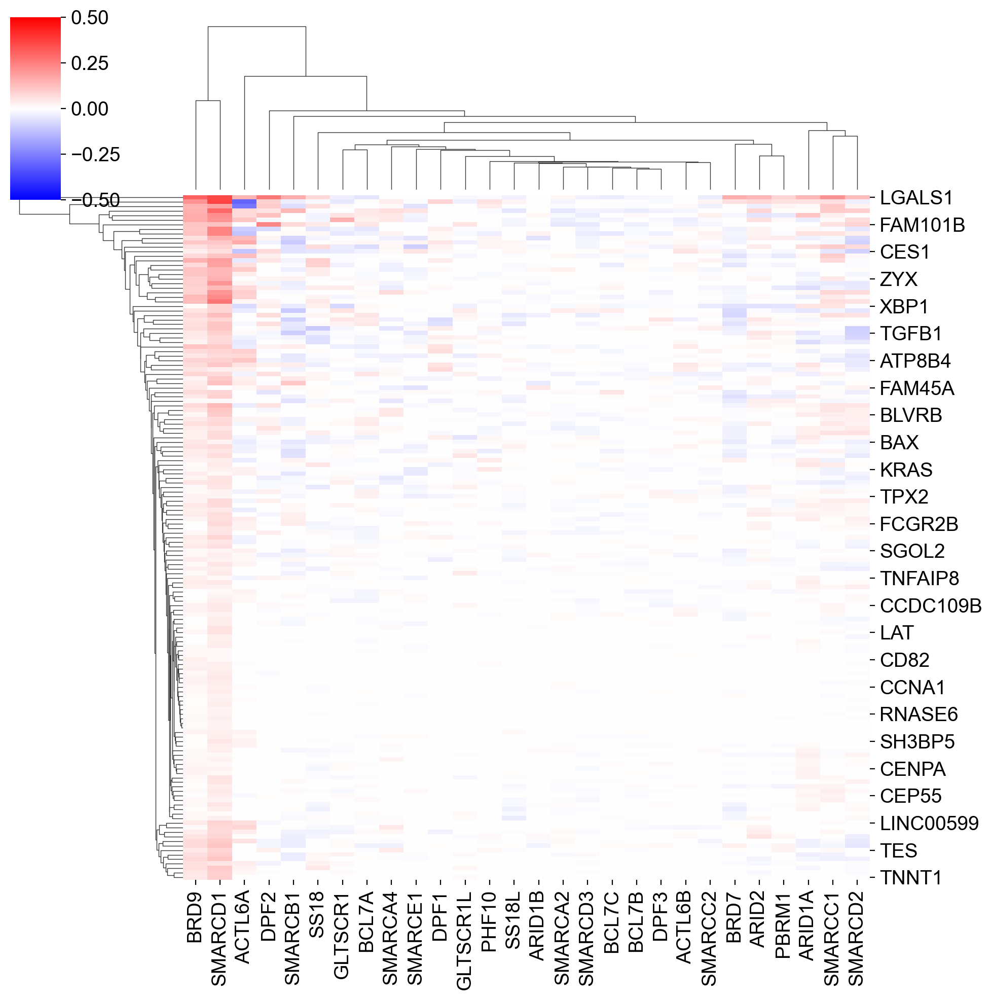

In [283]:
coef=adata.uns['coef.gene2'].T
x=0.5
sns.clustermap(coef.loc[dd['P3'],:],vmin=-x,vmax=x,cmap='bwr')

In [278]:
pro2genes.keys

NameError: name 'pro2genes' is not defined

In [266]:
go_p3=ordered_df2.sort_values(by='P3',ascending=False)


P0     -0.000000
P1      3.272186
P10    -0.000000
P11    -0.000000
P12    -0.000000
P2      3.925465
P3     15.521635
P4     -0.000000
P5     -0.000000
P6     -0.000000
P7     -0.000000
P8     -0.000000
P9     -0.000000
Name: mitotic cell cycle process:mitotic cell cycle process, dtype: float64
P0     -0.000000
P1      4.216104
P10    -0.000000
P11    -0.000000
P12    -0.000000
P2      4.340000
P3     13.354696
P4     -0.000000
P5     -0.000000
P6     -0.000000
P7     -0.000000
P8     -0.000000
P9     -0.000000
Name: mitotic cell cycle:mitotic cell cycle, dtype: float64
P0     -0.000000
P1     -0.000000
P10    -0.000000
P11    -0.000000
P12    -0.000000
P2      3.925465
P3     13.354696
P4     -0.000000
P5     -0.000000
P6     -0.000000
P7     -0.000000
P8     -0.000000
P9     -0.000000
Name: regulation of cellular process:regulation of cell cycle, dtype: float64
P0     -0.000000
P1     -0.000000
P10    -0.000000
P11    -0.000000
P12    -0.000000
P2     -0.000000
P3     11.432542
P4  

In [268]:
gos

p_value                   \
program                                            Pro: P0 Pro: P1 Pro: P10   
mitotic spindle elongation                            -0.0    -0.0     -0.0   
mitotic sister chromatid segregation                  -0.0    -0.0     -0.0   
cell cycle checkpoint signaling                       -0.0    -0.0     -0.0   
regulation of cyclin-dependent protein serine/t...    -0.0    -0.0     -0.0   
G1/S transition of mitotic cell cycle                 -0.0    -0.0     -0.0   
...                                                    ...     ...      ...   
regulation of CD8-positive, alpha-beta T cell a...    -0.0    -0.0     -0.0   
positive regulation of CD8-positive, alpha-beta...    -0.0    -0.0     -0.0   
regulation of apoptotic signaling pathway             -0.0    -0.0     -0.0   
regulation of extrinsic apoptotic signaling pat...    -0.0    -0.0     -0.0   
negative regulation of chromosome organization        -0.0    -0.0     -0.0   

                                                                               \
program                                            Pro: P11  Pro: P12 Pro: P2   
mitotic spindle elongation                             -0.0 -0.000000    -0.0   
mitotic sister chromatid segregation                   -0.0 -0.000000    -0.0   
cell cycle checkpoint signaling                        -0.0 -0.000000    -0.0   
regulation of cyclin-dependent protein serine/t...     -0.0 -0.000000    -0.0   
G1/S transition of mitotic cell cycle                  -0.0 -0.000000    -0.0   
...                                                     ...       ...     ...   
regulation of CD8-positive, alpha-beta T cell a...     -0.0  1.961953    -0.0   
positive regulation of CD8-positive, alpha-beta...     -0.0  3.105953    -0.0   
regulation of apoptotic signaling pathway              -0.0  1.431603    -0.0   
regulation of extrinsic apoptotic signaling pat...     -0.0  1.836110    -0.0   
negative regulation of chromosome organization         -0.0 -0.000000    -0.0   

                                                                              \
program                                              Pro: P3 Pro: P4 Pro: P5   
mitotic spindle elongation                          1.429559    -0.0    -0.0   
mitotic sister chromatid segregation                7.164624    -0.0    -0.0   
cell cycle checkpoint signaling                     4.012773    -0.0    -0.0   
regulation of cyclin-dependent protein serine/t...  4.255521    -0.0    -0.0   
G1/S transition of mitotic cell cycle               1.917310    -0.0    -0.0   
...                                                      ...     ...     ...   
regulation of CD8-positive, alpha-beta T cell a... -0.000000    -0.0    -0.0   
positive regulation of CD8-positive, alpha-beta... -0.000000    -0.0    -0.0   
regulation of apoptotic signaling pathway          -0.000000    -0.0    -0.0   
regulation of extrinsic apoptotic signaling pat... -0.000000    -0.0    -0.0   
negative regulation of chromosome organization      2.321257    -0.0    -0.0   

                                                                            \
program                                            Pro: P6 Pro: P7 Pro: P8   
mitotic spindle elongation                            -0.0    -0.0    -0.0   
mitotic sister chromatid segregation                  -0.0    -0.0    -0.0   
cell cycle checkpoint signaling                       -0.0    -0.0    -0.0   
regulation of cyclin-dependent protein serine/t...    -0.0    -0.0    -0.0   
G1/S transition of mitotic cell cycle                 -0.0    -0.0    -0.0   
...                                                    ...     ...     ...   
regulation of CD8-positive, alpha-beta T cell a...    -0.0    -0.0    -0.0   
positive regulation of CD8-positive, alpha-beta...    -0.0    -0.0    -0.0   
regulation of apoptotic signaling pathway             -0.0    -0.0    -0.0   
regulation of extrinsic apoptotic signaling pat...    -0.0    -0.0    

In [270]:
def print_terms(gos,cat):

    print(cat)
    if 'Pro: '+cat not in gos['p_value']:
        print(cat,'not found')
    else:
        terms=gos['p_value']['Pro: '+cat]
        terms=terms.sort_values(ascending=False)
        thresh=1
        for i in range(terms.shape[0]):
            if terms[i]>thresh:
                print(terms.index[i],np.round(terms.iloc[i],2))
    print('=====')
    
print_terms(gos,'P3')

P3
mitotic cell cycle process 15.52
regulation of cell cycle 13.35
mitotic cell cycle 13.35
regulation of cell cycle process 11.43
cell cycle 11.31
regulation of mitotic cell cycle 10.68
mitotic nuclear division 10.63
cell cycle process 10.62
nuclear division 10.17
microtubule cytoskeleton organization involved in mitosis 9.96
cell division 9.71
regulation of mitotic cell cycle phase transition 9.41
negative regulation of cellular process 9.41
organelle fission 9.41
protein phosphorylation 8.88
cell death 8.88
mitotic spindle organization 8.84
mitotic cell cycle phase transition 8.82
phosphorylation 8.58
cell population proliferation 8.51
regulation of phosphorus metabolic process 8.43
regulation of transferase activity 8.42
regulation of protein phosphorylation 8.42
regulation of phosphorylation 8.42
regulation of kinase activity 8.3
regulation of cell population proliferation 8.2
apoptotic process 7.94
cytoskeleton organization 7.94
regulation of phosphate metabolic process 7.86
regu

In [66]:
?sc.queries.enrich

In [86]:
go_res

,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents
0,GO:BP,GO:1903047,mitotic cell cycle process,8.901202e-19,True,"""A process that is part of the mitotic cell cy...",744,134,36,21029,0.268657,0.048387,query_1,"[GO:0000278, GO:0022402]"
1,GO:BP,GO:0051726,regulation of cell cycle,3.166397e-16,True,"""Any process that modulates the rate or extent...",1011,134,38,21029,0.283582,0.037587,query_1,"[GO:0007049, GO:0050794]"
2,GO:BP,GO:0000278,mitotic cell cycle,3.922006e-16,True,"""Progression through the phases of the mitotic...",895,134,36,21029,0.268657,0.040223,query_1,[GO:0007049]
3,GO:BP,GO:0010564,regulation of cell cycle process,4.371203e-14,True,"""Any process that modulates a cellular process...",675,134,30,21029,0.223881,0.044444,query_1,"[GO:0022402, GO:0051726]"
4,GO:BP,GO:0007049,cell cycle,7.180032e-14,True,"""The progression of biochemical and morphologi...",1713,134,45,21029,0.335821,0.026270,query_1,[GO:0009987]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
493,GO:BP,GO:0003330,regulation of extracellular matrix constituent...,4.897105e-02,True,"""Any process that modulates the rate, frequenc...",10,134,3,21029,0.022388,0.300000,query_1,"[GO:0070278, GO:1903053, GO:1903530]"
494,GO:BP,GO:0051231,spindle elongation,4.897105e-02,True,"""The cell cycle process in which the distance ...",10,134,3,21029,0.022388,0.300000,query_1,"[GO:0007017, GO:0007051, GO:0022402, GO:0098813]"
495,KEGG,KEGG:05161,Hepatitis B,4.980778e-02,True,Hepatitis B,161,72,7,8014,0.097222,0.043478,query_1,[KEGG:00000]
496,CORUM,CORUM:5543,CCNB1-CDC2 complex,4.986609e-02,True,CCNB1-CDC2 complex,2,48,2,3627,0.041667,1.000000,query_1,[CORUM:0000000]


In [9]:
gos.shape

(366, 2)

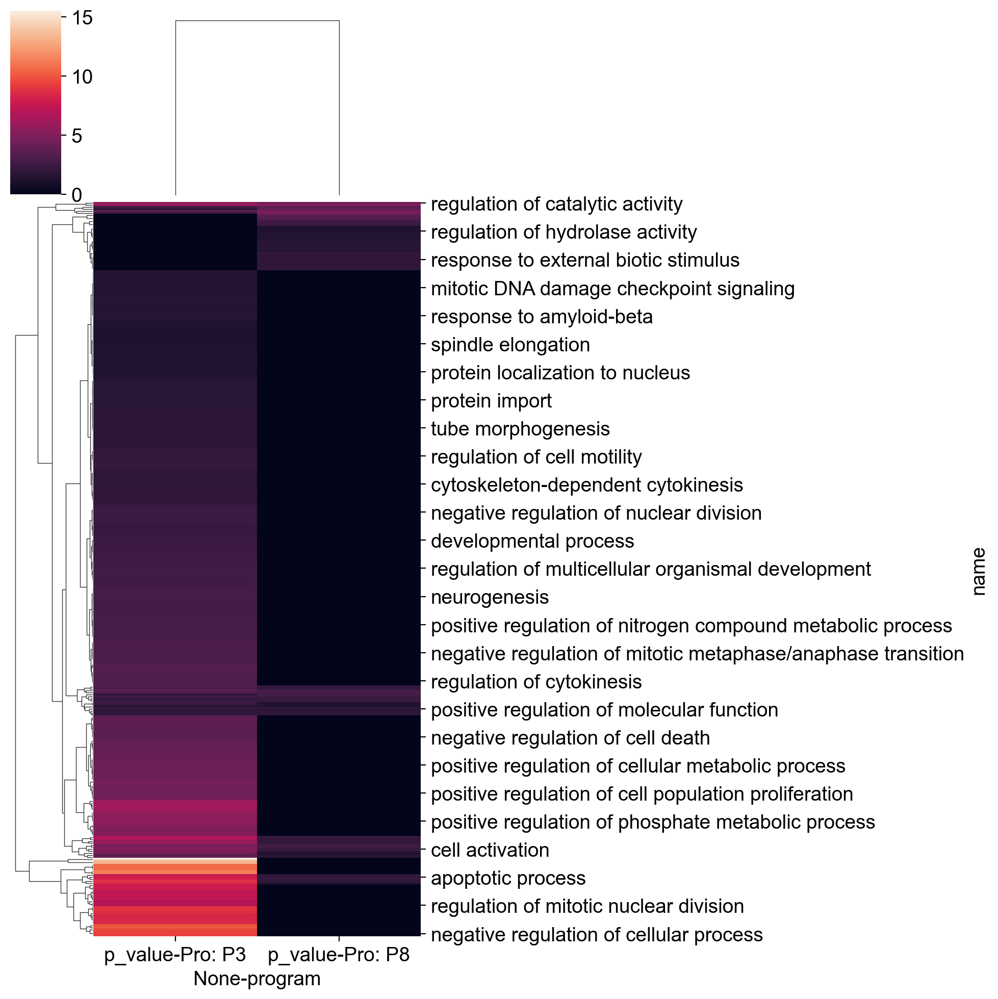

In [14]:
import seaborn as sns
sns.clustermap(gos)

In [15]:
gos

p_value        
program                                              Pro: P3 Pro: P8
name                                                                
DNA damage response, signal transduction by p53...  1.730827    -0.0
ERK1 and ERK2 cascade                               1.835211    -0.0
G1/S transition of mitotic cell cycle               1.917310    -0.0
G2/M transition of mitotic cell cycle               2.606349    -0.0
actin cytoskeleton organization                     2.136750    -0.0
...                                                      ...     ...
transmembrane receptor protein tyrosine kinase ...  1.730812    -0.0
tube development                                    1.674449    -0.0
tube morphogenesis                                  1.782495    -0.0
vascular associated smooth muscle cell prolifer...  1.316611    -0.0
wound healing                                       2.168008    -0.0

[366 rows x 2 columns]

In [21]:
go_res.shape

(498, 14)

In [23]:
go_list=go_res['native'][:3]
go_list

0    GO:1903047
1    GO:0051726
2    GO:0000278
Name: native, dtype: object

requests.get(http://purl.obolibrary.org/obo/go/go-basic.obo, stream=True)
  WROTE: go-basic.obo

go-basic.obo: fmt(1.2) rel(2022-05-16) 47,071 GO Terms; optional_attrs(relationship)


In [27]:
goid=go_list[0]

from goatools.gosubdag.gosubdag import GoSubDag

# Create a subset of the GO DAG which contains:
#   * The selected GO term and
#   * All the GO terms above it
gosubdag = GoSubDag(goid, godag, relationships=True, prt=False)

# Get additional information for chosen GO
ntgo = gosubdag.go2nt[goid]

# Choose fields and custom printing format
# prt_flds(gosubdag)  # Uncomment to see the available print fields
prtfmt = '{NS} {GO} D{depth:02} {GO_name}'

# Print detailed information for GO
print(prtfmt.format(**ntgo._asdict()))

BP GO:1903047 D03 mitotic cell cycle process


In [28]:
ntgo

NtGo(NS='BP', level=3, depth=3, reldepth=4, GO='GO:1903047', alt='', GO_name='mitotic cell cycle process', dcnt=285, D1='A', childcnt=57, REL='P...', REL_short='P', rel='....', id='GO:1903047')

In [29]:
gosubdag

In [30]:
from goatools.godag.go_tasks import get_go2parents

go2parents = get_go2parents(gosubdag.go2obj, gosubdag.relationships)
go2parents

{'GO:0022402': {'GO:0007049', 'GO:0009987'},
 'GO:0009987': {'GO:0008150'},
 'GO:0007049': {'GO:0009987'},
 'GO:0000278': {'GO:0007049'},
 'GO:1903047': {'GO:0000278', 'GO:0022402'}}

In [35]:
for parent in go2parents:
    ntgo = gosubdag.go2nt[parent]
    print(ntgo)
    print(prtfmt.format(**ntgo._asdict()))

NtGo(NS='BP', level=2, depth=2, reldepth=3, GO='GO:0022402', alt='', GO_name='cell cycle process', dcnt=828, D1='A', childcnt=55, REL='P...', REL_short='P', rel='.rdu', id='GO:0022402')
BP GO:0022402 D02 cell cycle process
NtGo(NS='BP', level=1, depth=1, reldepth=1, GO='GO:0009987', alt='', GO_name='cellular process', dcnt=18639, D1='A', childcnt=60, REL='....', REL_short='', rel='.rdu', id='GO:0009987')
BP GO:0009987 D01 cellular process
NtGo(NS='BP', level=2, depth=2, reldepth=2, GO='GO:0007049', alt='', GO_name='cell cycle', dcnt=870, D1='A', childcnt=2, REL='....', REL_short='', rel='prdu', id='GO:0007049')
BP GO:0007049 D02 cell cycle
NtGo(NS='BP', level=3, depth=3, reldepth=3, GO='GO:0000278', alt='', GO_name='mitotic cell cycle', dcnt=315, D1='A', childcnt=5, REL='....', REL_short='', rel='prdu', id='GO:0000278')
BP GO:0000278 D03 mitotic cell cycle
NtGo(NS='BP', level=3, depth=3, reldepth=4, GO='GO:1903047', alt='', GO_name='mitotic cell cycle process', dcnt=285, D1='A', childc

In [51]:


annotate_go_list(go_list)

dict_keys(['GO:0022402', 'GO:0009987', 'GO:0007049', 'GO:0000278', 'GO:1903047'])
dict_keys(['GO:0050794', 'GO:0050789', 'GO:0065007', 'GO:0009987', 'GO:0007049', 'GO:0051726'])
dict_keys(['GO:0007049', 'GO:0009987', 'GO:0000278'])


,go,parent,D,name
0,GO:1903047,GO:0022402,2,cell cycle process
1,GO:1903047,GO:0009987,1,cellular process
2,GO:1903047,GO:0007049,2,cell cycle
3,GO:1903047,GO:0000278,3,mitotic cell cycle
4,GO:1903047,GO:1903047,3,mitotic cell cycle process
0,GO:0051726,GO:0050794,3,regulation of cellular process
1,GO:0051726,GO:0050789,2,regulation of biological process
2,GO:0051726,GO:0065007,1,biological regulation
3,GO:0051726,GO:0009987,1,cellular process
4,GO:0051726,GO:0007049,2,cell cycle


NameError: name 'gosubdag' is not defined

In [ ]:
from goatools.godag.go_tasks import get_go2parents

go2parents = get_go2parents(gosubdag.go2obj, gosubdag.relationships)
for goid_parent in go2parents[goid]:
    print(prtfmt.format(**gosubdag.go2nt[goid_parent]._asdict()))

In [24]:
for go in go_list:
    print(go)
    

GO:1903047
GO:0051726
GO:0000278


In [ ]:
def programs2go(program2gene_dict,organism="hsapiens",fdr=0.1):
    
    """Get GO terms for programs.                                                                                            
                                                                                                                                                                 
    """

    gotable=pd.DataFrame(columns=['name','p_value','program'])
    
    for program in program2gene_dict:
        genes=program2gene_dict[program]
        go_res=sc.queries.enrich(genes, org=organism)
        go_res=go_res.loc[go_res['significant'],:]
        gotable_current=go_res.loc[go_res['source']=='GO:BP',['name','p_value']]
        if gotable_current.shape[0]==0:
            continue
        #correct p-value for multiple testing
        from statsmodels.stats.multitest import multipletests
        gotable_current['p_value']=multipletests(gotable_current['p_value'],method='fdr_bh')[1]
        gotable_current['program']='Pro: '+str(program)
        gotable=pd.concat([gotable,gotable_current],axis=0)
    go_table_result=gotable.pivot(index='name',columns='program')[['p_value']]
    go_table_result=go_table_result.fillna(1)
    go_table_result=-np.log10(go_table_result)
    
    #go through each program and print me the sig go terms
    for program in go_table_result.columns:
        keep=go_table_result.loc[go_table_result[program]>-np.log10(fdr),:]
        keep=keep.sort_values(by=program,ascending=False)[program]
    return(go_table_result)